# NOTA: descargar las imagenes de TEST desde el siguiente link

### https://drive.google.com/drive/folders/117aRAr9kXUSXA-oI3Y5MzmWhZUiNaHpJ?usp=drive_link

# Inferencia

In [ ]:
! pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

# Librerias a utilizar

In [1]:
import os
import shutil
import json
import matplotlib.pyplot as plt
from ultralytics import YOLO

## Ajustes Iniciales

In [11]:
# Nombre del alumno
student_name = "Taiel_Raffaeli"

# Ruta al archivo de pesos
model_path = "./runs/detect/aumentado_2/weights/best.pt"

# Ruta al directorio que contiene las imagenes
imgs_dir = "./img_test"

# Ruta al directorio de destino de las detecciones
base_dir = "./data_out"
dets_dir = os.path.join(base_dir, student_name)

In [22]:
dets_dir

'./data_out\\Taiel_Raffaeli'

In [51]:
# Reestablecimiento del directorio de destino (eliminacion)
if os.path.exists(dets_dir):
    shutil.rmtree(dets_dir)

os.makedirs(dets_dir)

## Inferencia

### Formato YOLOv5 para las salidas de las inferencias en archivos "txt"

Se genera un archivo con las detecciones en formato YOLOv5, donde cada línea contiene:
 cls, xc, yx, w, h, c

* **cls**: número de índice de la clase

* **xc**: coordenada x al centro de la caja delimitadora (bbox)

* **yx**: coordenada y al centro de la caja delimitadora (bbox)

* **w**: ancho de la caja delimitadora

* **h**: alto de la caja delimitadora

* **c**: certeza del modelo sobre la clasificacíon (confidence)

### Formato para los archivos de envido.json

Además de las detecciones anteriores, se crea un archivo llamado envido.json con la siguiente estructura:

```json
{
    "nombre_img.jpg": {
        "total_cards": TOTAL_DE_CARTAS,
        "cards": {
            "E": [ VALORES ],
            "C": [ VALORES ],
            "B": [ VALORES ],
            "O": [ VALORES ]
        },
        "points": PUNTOS_DE_ENVIDO,
        "figure": CLASE_DEL_ENVIDO
    },
  ...
}
```

# Generar archivos txt
---
Este código carga un modelo YOLOv8 previamente entrenado y utiliza este modelo para hacer predicciones sobre un conjunto de imágenes de prueba. 

Define una función **guardar_resultados** para guardar las predicciones en archivos de texto. Luego, carga el modelo y configura los directorios para las imágenes de prueba y para guardar los resultados. 

Crea el directorio de salida si no existe, y luego procesa cada imagen en el directorio de prueba, guardando las predicciones en un archivo .txt y mostrando la imagen con las predicciones sobrepuestas utilizando Matplotlib.

### Guardar resultados

In [52]:
def guardar_resultados(result, image_path, output_txt_dir):
        base_name = os.path.basename(image_path).split('.')[0]
        txt_file_name = os.path.join(output_txt_dir, f'{base_name}.txt')
        result[0].save_txt(txt_file_name, save_conf=True)

### Visualizacion y guardado de predicciones


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000402.jpg: 640x384 1 2E, 1 5C, 1 8C, 1 10O, 1 11O, 1 12O, 1 12E, 22.1ms
Speed: 2.0ms preprocess, 22.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


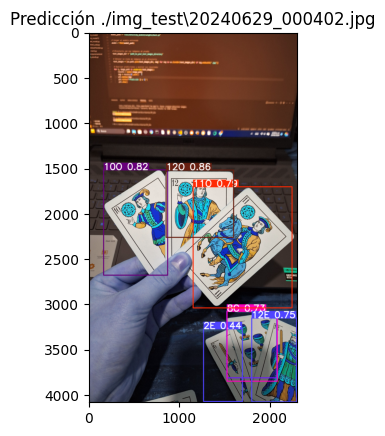


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000428.jpg: 640x384 1 8C, 1 11C, 1 11E, 1 11B, 1 12E, 1 12B, 19.0ms
Speed: 3.0ms preprocess, 19.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 384)


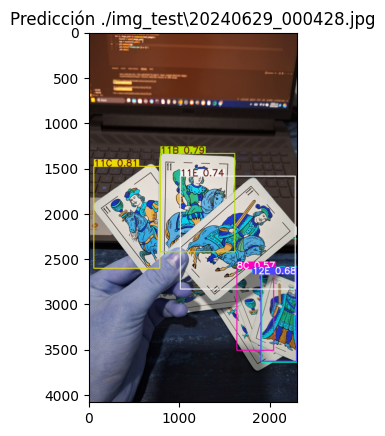


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000440.jpg: 640x384 1 5C, 1 7E, 1 8C, 1 10B, 1 12E, 19.5ms
Speed: 3.0ms preprocess, 19.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


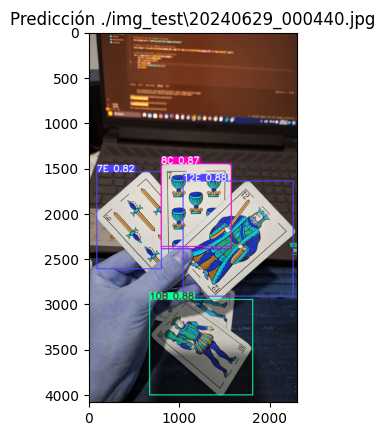


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000454.jpg: 640x384 1 10C, 1 10B, 1 11C, 1 12C, 18.0ms
Speed: 4.0ms preprocess, 18.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


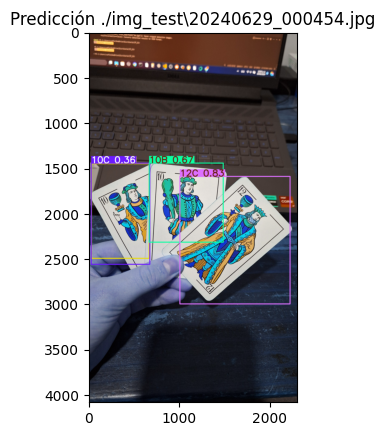


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000509.jpg: 640x384 1 2O, 1 3E, 1 5B, 19.0ms
Speed: 3.0ms preprocess, 19.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


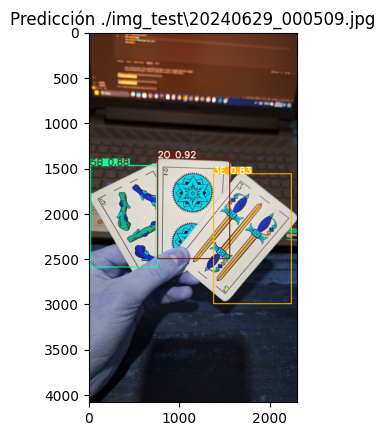


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000525.jpg: 640x384 1 5C, 1 6C, 1 7B, 19.0ms
Speed: 2.0ms preprocess, 19.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


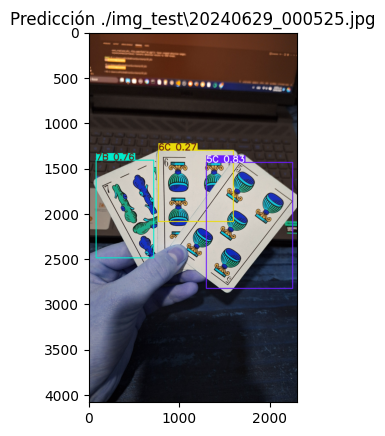


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000542.jpg: 640x384 1 3B, 1 4O, 1 12E, 19.0ms
Speed: 3.0ms preprocess, 19.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


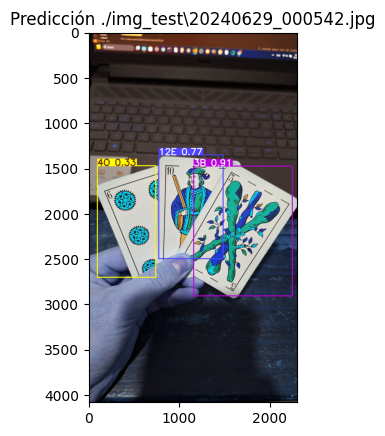


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000556.jpg: 640x384 1 2E, 1 5E, 1 12B, 18.9ms
Speed: 3.0ms preprocess, 18.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 384)


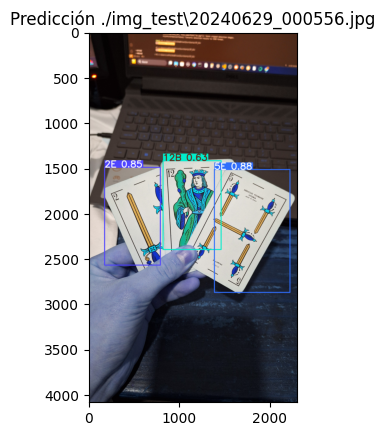


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000612.jpg: 640x384 1 3O, 1 4B, 1 6B, 19.0ms
Speed: 5.0ms preprocess, 19.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


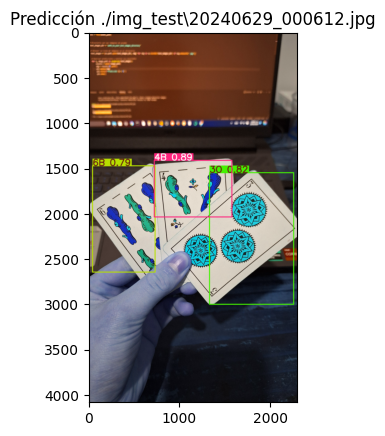


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000633.jpg: 640x384 1 1B, 2 2Bs, 1 4O, 18.9ms
Speed: 3.1ms preprocess, 18.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


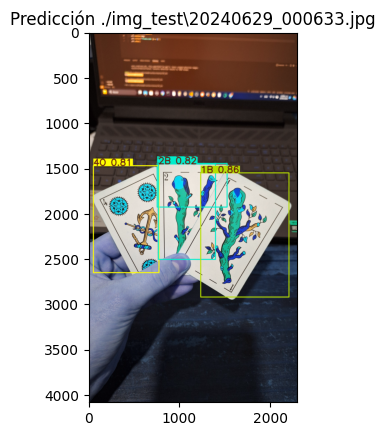


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000657.jpg: 640x384 1 1O, 1 1C, 1 1E, 18.4ms
Speed: 3.0ms preprocess, 18.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


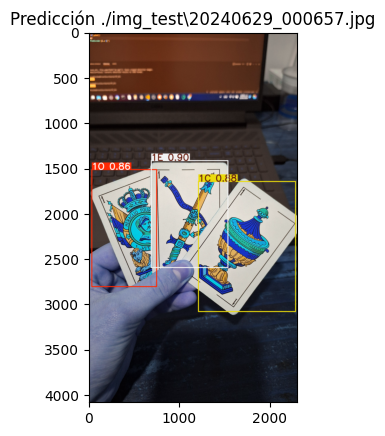


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000710.jpg: 640x384 1 3C, 1 5O, 1 7E, 19.1ms
Speed: 3.0ms preprocess, 19.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


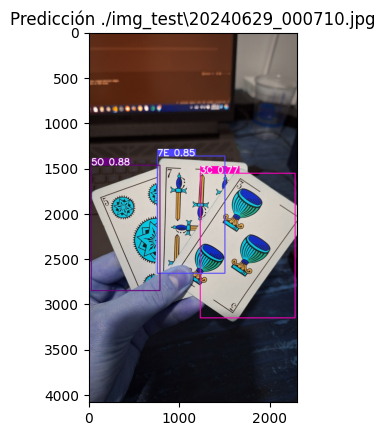


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000723.jpg: 640x384 1 2C, 1 4C, 1 4E, 1 7O, 19.0ms
Speed: 3.1ms preprocess, 19.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


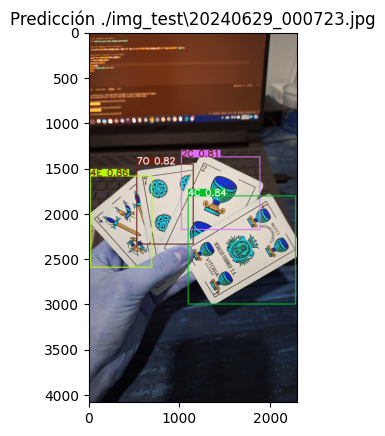


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000800.jpg: 640x384 1 12C, 2 Js, 19.0ms
Speed: 3.0ms preprocess, 19.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


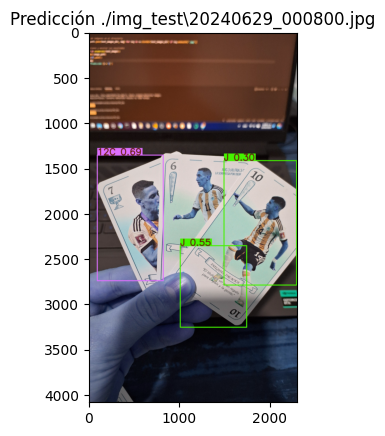


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000816.jpg: 640x384 1 1O, 1 11B, 2 Js, 19.0ms
Speed: 3.0ms preprocess, 19.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


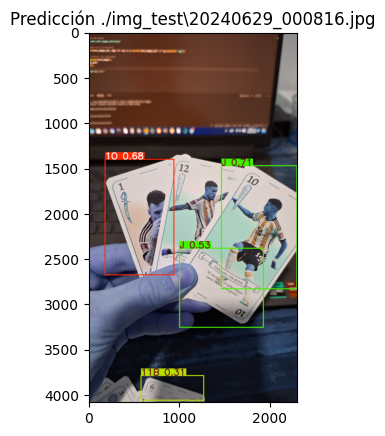


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\20240629_000831.jpg: 640x384 1 10C, 1 12O, 2 12Cs, 19.0ms
Speed: 3.0ms preprocess, 19.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


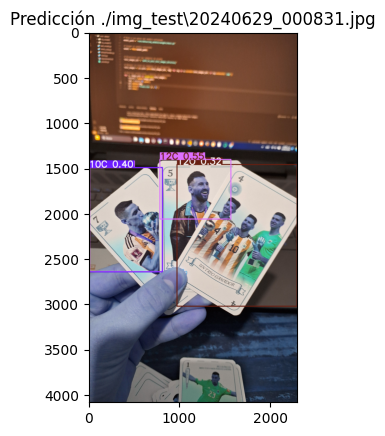


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_173711753_HDR.jpg: 640x512 1 11C, 22.5ms
Speed: 3.0ms preprocess, 22.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 512)


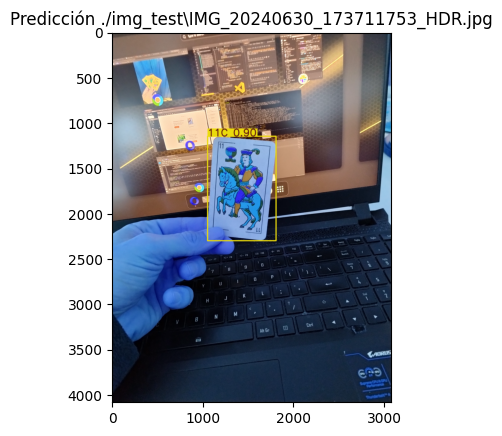


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_173737533.jpg: 640x512 1 1C, 1 1B, 1 2B, 1 5C, 22.0ms
Speed: 3.0ms preprocess, 22.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


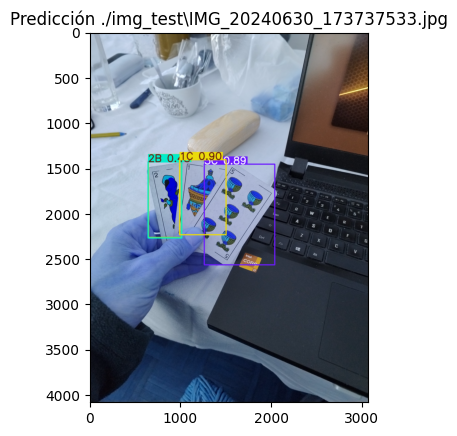


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_173758691.jpg: 640x512 1 1C, 1 2B, 21.0ms
Speed: 4.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


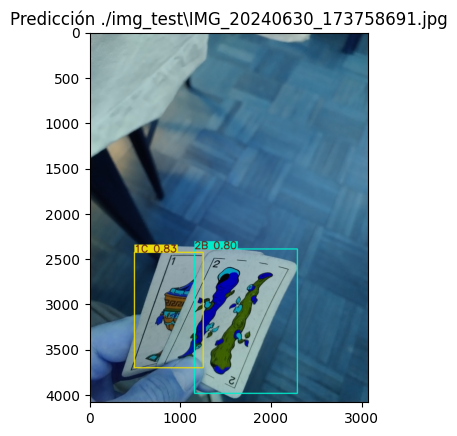


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_173822184_HDR.jpg: 640x512 1 3B, 1 6B, 1 7E, 1 7B, 21.5ms
Speed: 3.0ms preprocess, 21.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


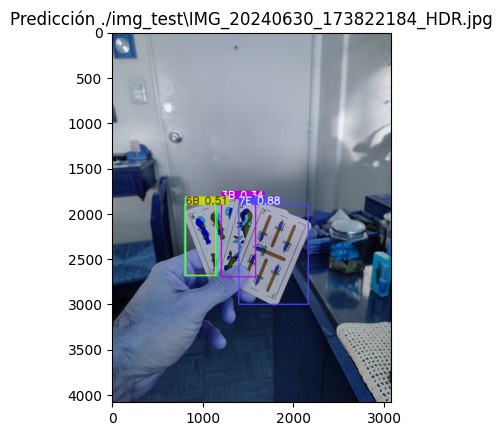


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_173828513_HDR.jpg: 640x512 1 3B, 1 6B, 1 7E, 1 7B, 22.0ms
Speed: 3.0ms preprocess, 22.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


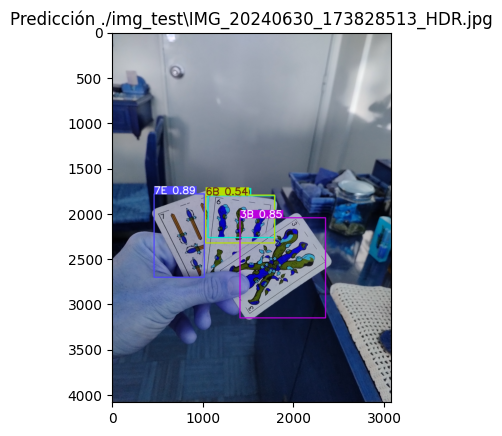


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_173836085.jpg: 640x512 1 6B, 1 7E, 21.0ms
Speed: 3.0ms preprocess, 21.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 512)


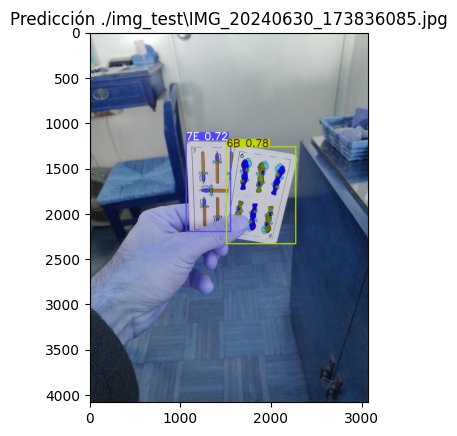


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_173859456.jpg: 640x512 1 3B, 22.0ms
Speed: 3.0ms preprocess, 22.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


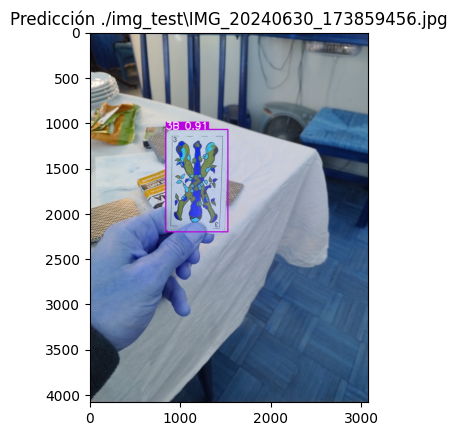


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_173918579.jpg: 640x512 3 6Os, 1 8O, 21.0ms
Speed: 4.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


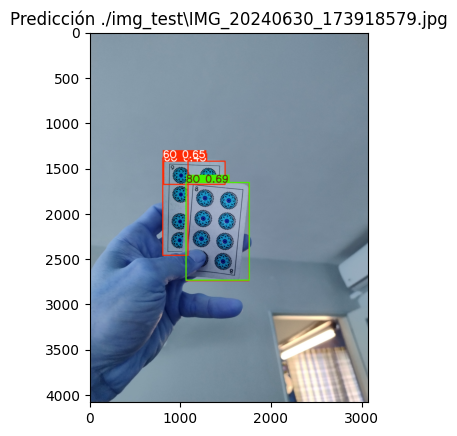


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_173929084.jpg: 640x512 1 3O, 1 6O, 1 7O, 22.0ms
Speed: 3.0ms preprocess, 22.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


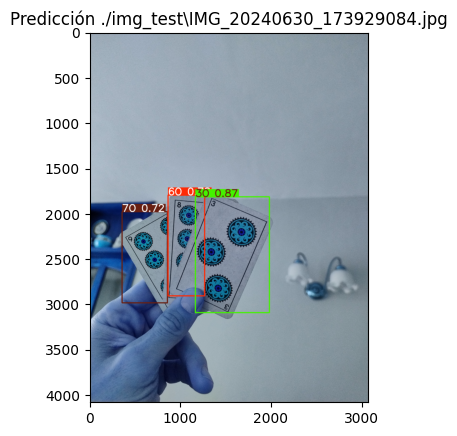


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_173954348.jpg: 640x512 1 1O, 1 12C, 21.5ms
Speed: 5.0ms preprocess, 21.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


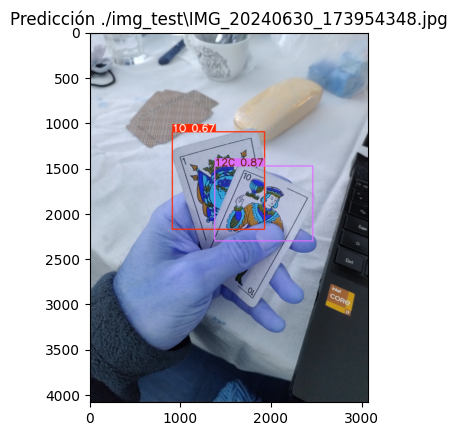


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174005265.jpg: 640x512 1 1O, 21.6ms
Speed: 3.0ms preprocess, 21.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


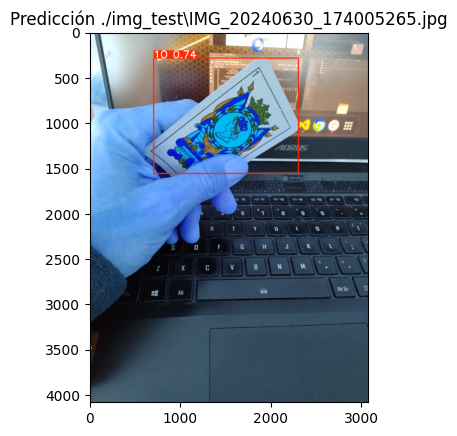


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174017809.jpg: 640x512 1 9E, 21.0ms
Speed: 3.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


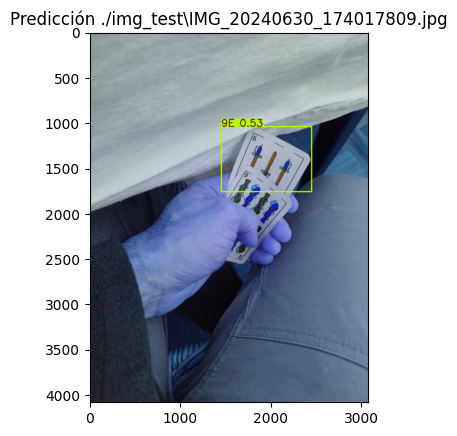


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174105714.jpg: 640x512 1 8B, 21.0ms
Speed: 3.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


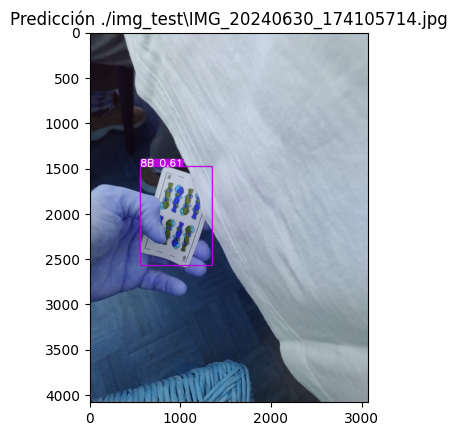


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174115784.jpg: 640x512 1 7E, 1 8C, 1 9C, 1 9E, 20.9ms
Speed: 4.0ms preprocess, 20.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


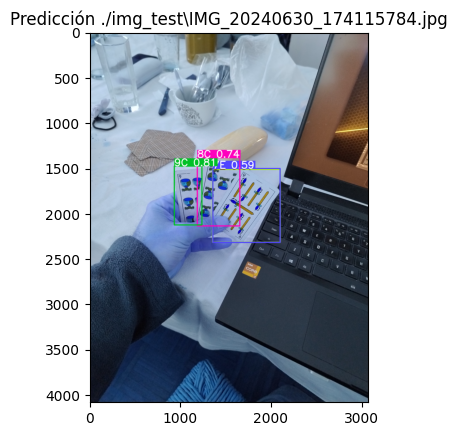


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174133804_HDR.jpg: 640x512 1 3E, 1 4E, 21.0ms
Speed: 6.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


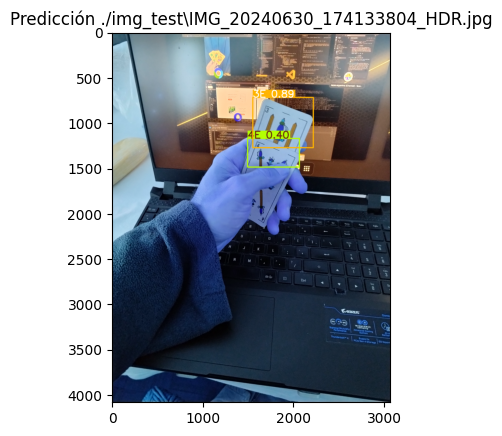


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174142929_HDR.jpg: 640x512 1 3E, 22.0ms
Speed: 3.0ms preprocess, 22.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 512)


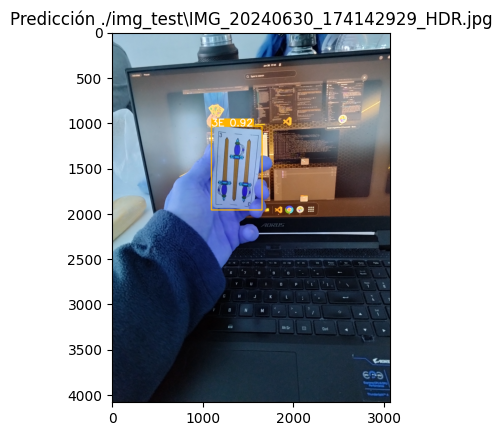


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174155383_HDR.jpg: 640x512 1 11E, 1 12E, 21.0ms
Speed: 3.0ms preprocess, 21.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 512)


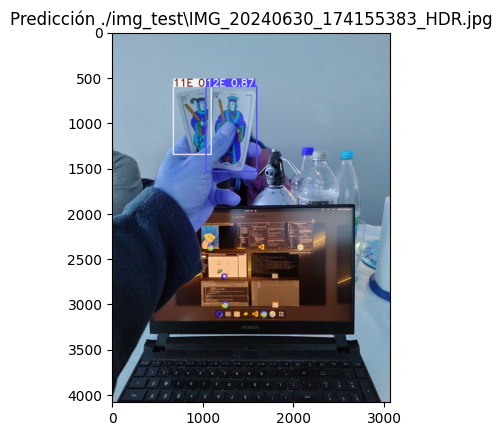


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174208092.jpg: 640x512 1 5E, 1 11O, 21.0ms
Speed: 4.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


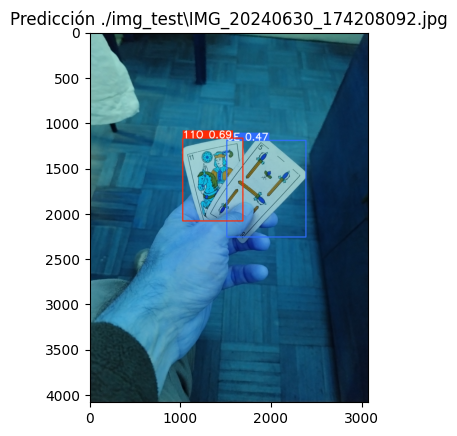


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174223161_HDR.jpg: 640x512 1 4O, 2 10Es, 1 12B, 20.7ms
Speed: 4.1ms preprocess, 20.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 512)


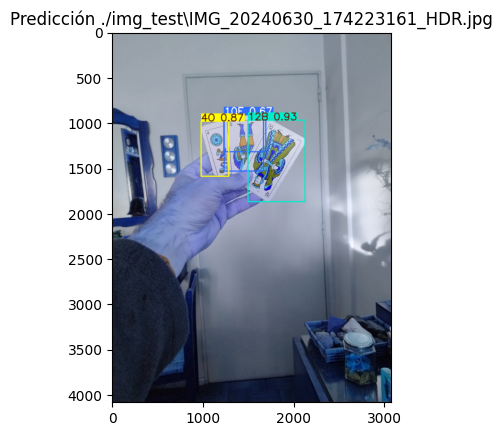


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174235296.jpg: 640x512 1 4O, 1 10C, 1 10E, 22.0ms
Speed: 3.0ms preprocess, 22.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


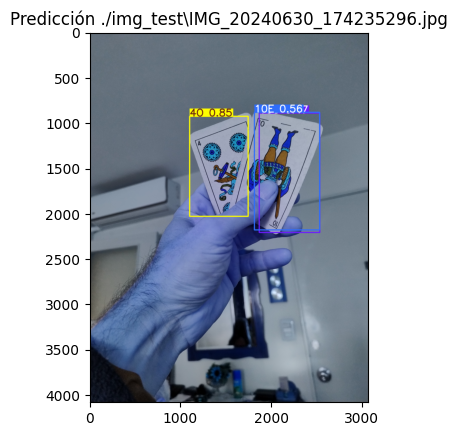


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174246178_HDR.jpg: 640x512 1 2C, 21.0ms
Speed: 3.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


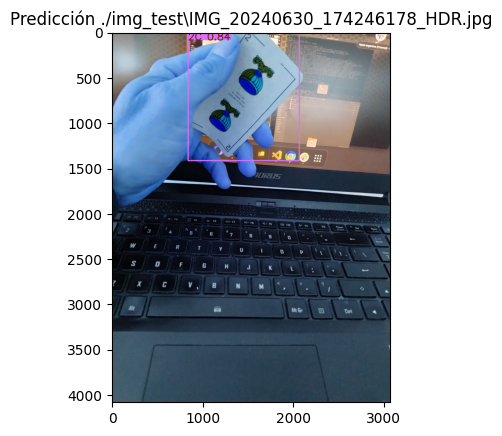


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174302382_HDR.jpg: 640x512 1 1E, 1 6C, 20.5ms
Speed: 4.0ms preprocess, 20.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


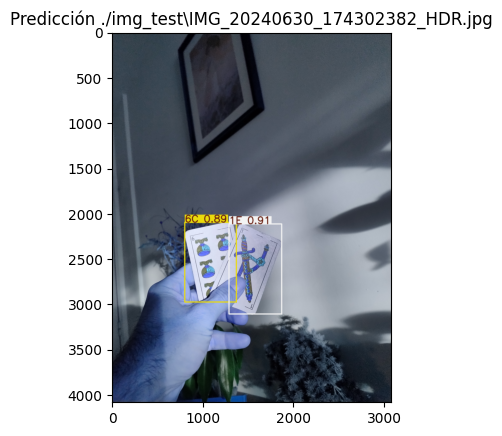


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174316833.jpg: 640x512 1 2O, 1 4C, 21.0ms
Speed: 4.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


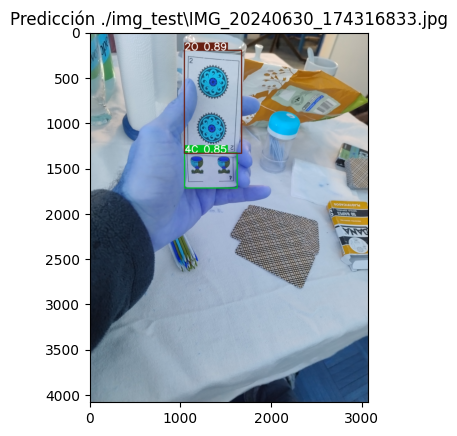


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174333447.jpg: 640x512 1 4B, 1 7B, 22.0ms
Speed: 3.0ms preprocess, 22.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 512)


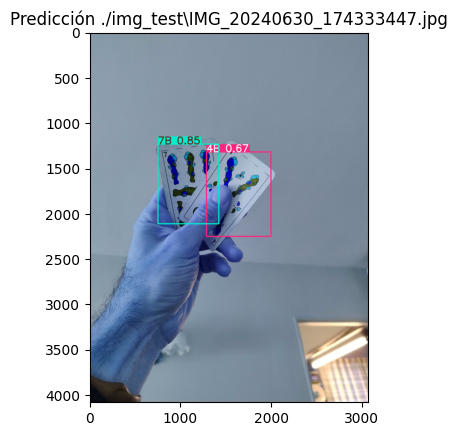


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174349395.jpg: 640x512 1 7O, 1 12B, 21.1ms
Speed: 3.9ms preprocess, 21.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


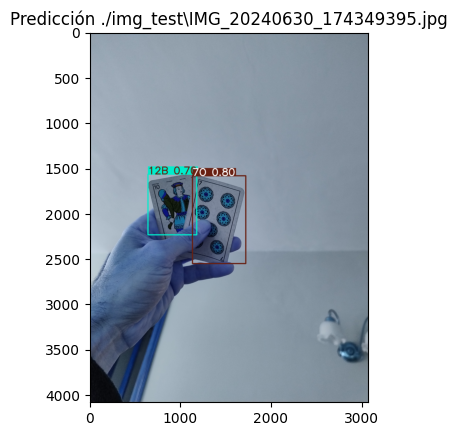


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174406256.jpg: 640x512 1 5O, 1 6O, 21.0ms
Speed: 3.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


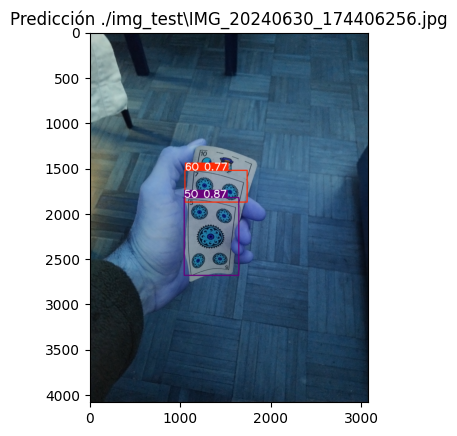


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174418639.jpg: 640x512 1 5O, 1 6O, 1 11E, 21.0ms
Speed: 3.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


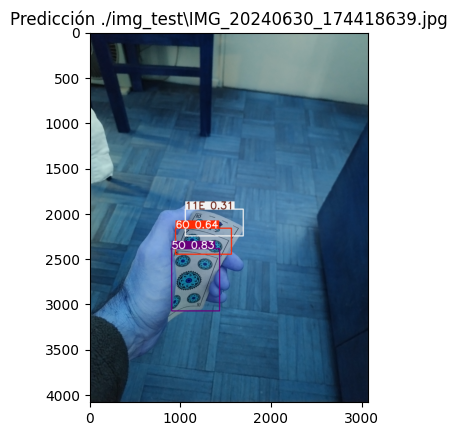


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174434126.jpg: 640x512 1 7C, 1 12O, 20.5ms
Speed: 3.0ms preprocess, 20.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 512)


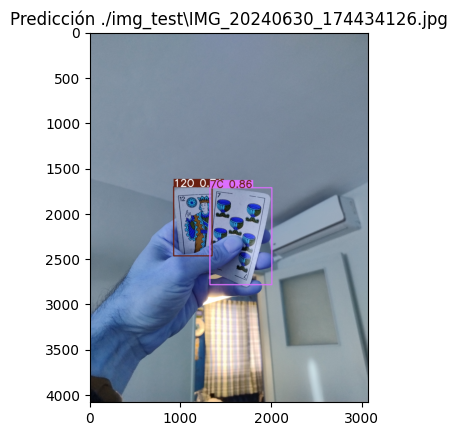


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174445046_HDR.jpg: 640x512 1 6O, 21.0ms
Speed: 4.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


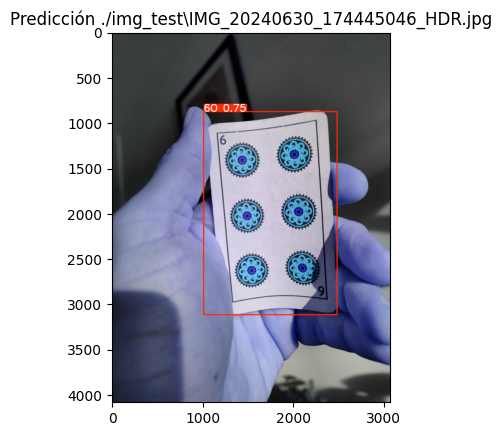


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174453153.jpg: 640x512 1 1B, 1 3C, 21.0ms
Speed: 3.0ms preprocess, 21.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


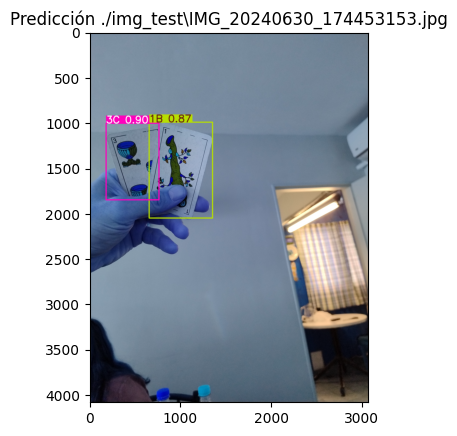


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174459285.jpg: 512x640 1 5B, 22.0ms
Speed: 3.0ms preprocess, 22.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


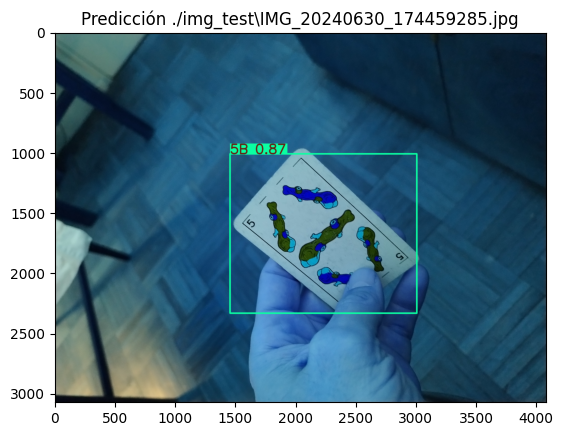


image 1/1 c:\Users\raffa\OneDrive\Escritorio\truco_app\img_test\IMG_20240630_174514649_HDR.jpg: 640x512 1 11B, 1 12O, 1 12C, 22.0ms
Speed: 4.0ms preprocess, 22.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)


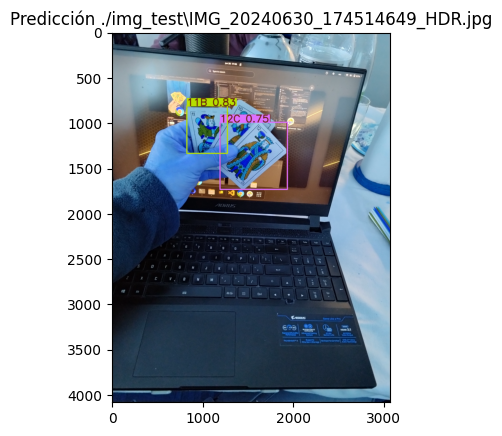

In [53]:
# Cargar el modelo entrenado
model = YOLO(model_path)

# Directorio con las imágenes de prueba
test_images_dir = imgs_dir

# Directorio para guardar los archivos .txt con los resultados
output_txt_dir = dets_dir

# Crear el directorio de salida si no existe
os.makedirs(output_txt_dir, exist_ok=True)

# Obtener la lista de imágenes en el directorio
test_images = [img for img in os.listdir(test_images_dir) if img.endswith('.jpg')]

for img in test_images:
  img_path = os.path.join(test_images_dir, img)
  result = model(img_path)
  guardar_resultados(result, img_path, output_txt_dir)
  #print(type(result))

  # Mostrar la imagen con las predicciones
  img = result[0].plot()
  plt.imshow(img)
  plt.title(f'Predicción {img_path}')
  plt.show(block=True)



# Escritura del archivo envido.json
---

### Se definen las figuientes funciones para crear el archivo .json:

1. **`obtener_path_txt(base_dir)`**: Esta función obtiene las rutas y nombres de todos los archivos `.txt` en un directorio dado y los devuelve en una tupla. 

2. **`clases_cartas(txt_path)`**: Esta función toma la ruta de un archivo `.txt` que contiene etiquetas de clases de cartas y las convierte en nombres de cartas legibles. Lee el archivo línea por línea, convierte los identificadores de clase en nombres utilizando un diccionario, y devuelve una lista de nombres de cartas.

3. **`diccionario_archivo(clases, archivo_txt, data)`**: Toma la lista de clases de cartas, el nombre del archivo `.txt` correspondiente y una estructura de datos (diccionario) para almacenar la información. Calcula los puntos de envido y clasifica las cartas en diferentes categorías. Luego, organiza esta información en el diccionario `data` bajo el nombre de la imagen correspondiente.

4. **`calcular_envido(clases)`**: Esta función toma una lista de nombres de cartas, valida que haya exactamente tres cartas y calcula el puntaje de envido según las reglas del juego. Si no hay una combinación válida para el envido, retorna 0 puntos y la clase mayoritaria de las cartas.

5. **`crar_json(carpeta)`**: Esta función coordina la creación del archivo JSON final. Llama a `obtener_path_txt` para obtener las rutas de los archivos `.txt`, luego usa `diccionario_archivo` para procesar cada archivo y llenar un diccionario con la información de las cartas y sus puntos. Finalmente, guarda este diccionario en un archivo JSON en el directorio especificado.

### Obtener rutas de archivos.txt

In [54]:
def obtener_path_txt(base_dir):
  paths_txt = [os.path.join(base_dir, archivo) for archivo in os.listdir(base_dir) if archivo.endswith('.txt')]
  nombres_txt = [archivo for archivo in os.listdir(base_dir) if archivo.endswith('.txt')]
  return (paths_txt, nombres_txt)


### Obtener clases

In [55]:
def clases_cartas(txt_path=str):
  name_ids = {
  0: "1O", 1: "1C", 2: "1E", 3: "1B",
  4: "2O", 5: "2C", 6: "2E", 7: "2B",
  8: "3O", 9: "3C", 10: "3E", 11: "3B",
  12: "4O", 13: "4C", 14: "4E", 15: "4B",
  16: "5O", 17: "5C", 18: "5E", 19: "5B",
  20: "6O", 21: "6C", 22: "6E", 23: "6B",
  24: "7O", 25: "7C", 26: "7E", 27: "7B",
  28: "8O", 29: "8C", 30: "8E", 31: "8B",
  32: "9O", 33: "9C", 34: "9E", 35: "9B",
  36: "10O", 37: "10C", 38: "10E", 39: "10B",
  40: "11O", 41: "11C", 42: "11E", 43: "11B",
  44: "12O", 45: "12C", 46: "12E", 47: "12B",
  48: "J", 49: "SKIP", 50: "SSKIP"
  }

  file = txt_path
  with open(file, "r") as file:
    lines = file.readlines()

  clases = []

  for line in lines:
    clase = int(line.split()[0])
    clases.append(name_ids.get(clase))

  return clases


### Calcular el envido

In [56]:
def calcular_envido(clases):
    # Función para determinar la clase mayoritaria
    def determinar_clase_mayoritaria(clases):
        from collections import Counter
        clases_nombres = [clase[-1] for clase in clases]
        conteo_clases = Counter(clases_nombres)
        return conteo_clases.most_common(1)[0][0]

    # Chequear que haya exactamente 3 cartas
    if len(clases) != 3:
        return 0, determinar_clase_mayoritaria(clases)

    # Extraer valores y palos de las cartas
    valores = []
    palos = []
    for clase in clases:
        palo = clase[-1]
        if palo == "J":
            valor = 0
        else:
            valor = int(clase[:-1])
            
        # Asignar valor 0 a las cartas 10, 11 y 12
        if valor in [10, 11, 12]:
            valor = 0
        elif valor in [8, 9] or clase == 'J':
            return 0, determinar_clase_mayoritaria(clases)

        valores.append(valor)
        palos.append(palo)

    # Calcular los puntos de envido
    max_puntos = 0
    for i in range(3):
        for j in range(i + 1, 3):
            if palos[i] == palos[j]:
                puntos = 20 + valores[i] + valores[j]
                if puntos > max_puntos:
                    max_puntos = puntos

    # Determinar la clase mayoritaria si no hay envido
    if max_puntos == 0:
        return 0, determinar_clase_mayoritaria(clases)

    return max_puntos, palos[0]

### Crear diccionario

In [57]:
def diccionario_archivo(clases, archivo_txt, data):
  img_name = archivo_txt.replace('.txt', '.jpg')
  puntos, mejor_clase = calcular_envido(clases)
  data[img_name] = {}
  data[img_name]["total_cards"] = len(clases)
  data[img_name]["cards"] = {"E": [], "C": [], "B": [], "O": [], "J":[]}
  data[img_name]["points"] = puntos
  data[img_name]["figure"] = mejor_clase
  for clase in clases:
    clase_nombre = clase[-1]
    if clase == "J":
      clase_valor = 0
      data[img_name]["cards"]["J"].append(clase_valor)
    else:
      clase_valor = int(clase[:-1])
      
    if clase_nombre == "E":
      data[img_name]["cards"]["E"].append(clase_valor)
    elif clase_nombre == "C":
      data[img_name]["cards"]["C"].append(clase_valor)
    elif clase_nombre == "B":
      data[img_name]["cards"]["B"].append(clase_valor)
    else:
      data[img_name]["cards"]["O"].append(clase_valor)

### Crear el archivo json

In [58]:
def crar_json(carpeta=str):
  tupla = obtener_path_txt(carpeta)
  data = {}
  for i, paths in enumerate(tupla[0]):
    diccionario_archivo(clases_cartas(paths), tupla[1][i], data)
  file_name = 'envido.json'
  file_path = os.path.join(carpeta, file_name)
  with open(file_path, 'w') as json_file:
      json.dump(data, json_file, indent=4)
  print(f"Archivo JSON creado con éxito en {file_path}.")


In [59]:
# obtener_path_txt("./truco_app/data_out/")
# ([lista de path], [lista de nombres de archivos])

# clases_cartas("./truco_app/data_out/IMG_20240630_173737533.txt")
# ['1C', '5C', '2B', '1B'] de un archivo me trae las cartas detectadas

# puntos, mejor_clase = calcular_envido(clases)
# devuelve los puntos del envido y l clase mayoritaria

# diccionario_archivo(clases_cartas(paths), tupla[1][i], data)
# Crea la estructura del archivo json

# crar_json("./truco_app/data_out/")
# Crea el archivo json

In [60]:
crar_json(dets_dir)

Archivo JSON creado con éxito en ./data_out\Taiel_Raffaeli\envido.json.
